# Crypt segmentation pipeline: step-by-step walkthrough

This notebook provides a **step-by-step walkthrough of the crypt segmentation pipeline** for a single intestinal organoid. The goal is to illustrate how the different components of the method work together to identify crypt structures on the organoid surface.

At each stage of the pipeline, we compute and visualize **intermediate results**, including geometric descriptors of the mesh, vocabulary encodings based on the Heat Kernel Signature (HKS), candidate crypt regions, filtering steps, and the final refined segmentation. By examining these intermediate outputs on a real example, users can better understand how the algorithm interprets surface geometry and how individual parameters influence the detection of crypts.

This notebook is therefore intended both as a **learning resource** for understanding the segmentation method and as a **practical tool for debugging and parameter exploration**.


In [91]:
# --- Imports ---
import os
import numpy as np

# Pipeline modules (from the scripts you provided)
from pathlib import Path
import sys

from organograph.io_utils.dataset_config import load_mesh_dataset_config, load_cell_table_config


## 1) Dataset paths + selection
Edit these to point at your dataset. 


In [ ]:
# -----------------------
# CONFIG (edit these)
# -----------------------

NOTEBOOK_DIR = Path.cwd().resolve()

DATASET         = "20251201"

MESH_DATA_DIR   = os.path.join(NOTEBOOK_DIR, "..", "..", "NicoleData", DATASET, "fractal_output")
CELLS_CSV       = os.path.join(NOTEBOOK_DIR, "..", "..", "NicoleData", DATASET, "cell_features_class.csv") 
VOCAB_PATH      = os.path.join(NOTEBOOK_DIR, "..",  "sim", "vocab_with_meta.npz") 

# If you already know the exact mesh file, set it here and skip discovery, otherwise set None
TIMEPOINT  = 'day4p5'  

WELL   = "B03"
ORG_ID = "144"

# WELL   = "B02"
# ORG_ID = "124"

# WELL   = "B04"
# ORG_ID = "4"

# WELL   = "B05"
# ORG_ID = "54"

# WELL   = "B02"
# ORG_ID = "115"

# WELL   = "B02"
# ORG_ID = "100"

# WELL   = "B02"
# ORG_ID = "31"



MESH_PATH = (
    Path(MESH_DATA_DIR)
    / TIMEPOINT
    / "251130R0.zarr"
    / WELL[0]           # "B"
    / WELL[1:]          # "03"
    / "2_zillum_registered"
    / "meshes"
    / "nnorg_corrected_annotated_by_projection"
    / f"{ORG_ID}.vtp"
)

print("MESH_DATA_DIR =", MESH_DATA_DIR)
print("CELLS_CSV     =", CELLS_CSV)
print("VOCAB_PATH    =", VOCAB_PATH)
print("TIMEPOINT     =", TIMEPOINT)
print("MESH_PATH     =", MESH_PATH)

In [ ]:
# # -----------------------
# # CONFIG (edit these)
# # -----------------------

# NOTEBOOK_DIR    = Path.cwd().resolve()
# DATASET         = "20250929"

# MESH_DATA_DIR   = os.path.join(NOTEBOOK_DIR, "..", "..", "NicoleData", DATASET, "fractal_output")
# CELLS_CSV       = os.path.join(NOTEBOOK_DIR, "..", "..", "NicoleData", DATASET, "cell_types_class.csv") 
# VOCAB_PATH      = os.path.join(NOTEBOOK_DIR, "..",  "sim", "vocab_with_meta.npz") 

# # If you already know the exact mesh file, set it here and skip discovery, otherwise set None
# TIMEPOINT  = 'day3p5'  

# WELL   = "A04"
# ORG_ID = "52"



# MESH_CONFIG_PATH= os.path.join(NOTEBOOK_DIR, "..", "..", "NicoleData", DATASET, "mesh_config.json")
# mesh_cfg = load_mesh_dataset_config(MESH_CONFIG_PATH)

# ZARR_NAME_BY_TP = mesh_cfg["zarr_name_by_tp"]
# ROUND_BY_TP = mesh_cfg["round_by_tp"]
# MESHNAME_BY_TP = mesh_cfg["meshname_by_tp"]
# WELLS_BY_TP = mesh_cfg.get("wells_by_tp", {})


# MESH_PATH = (
#     Path(MESH_DATA_DIR)
#     / TIMEPOINT
#     / ZARR_NAME_BY_TP[TIMEPOINT]
#     / WELL[0]           # "B"
#     / WELL[1:]          # "03"
#     / ROUND_BY_TP[TIMEPOINT]
#     / "meshes"
#     / MESHNAME_BY_TP[TIMEPOINT]
#     / f"{ORG_ID}.vtp"
# )


# print("MESH_DATA_DIR =", MESH_DATA_DIR)
# print("CELLS_CSV     =", CELLS_CSV)
# print("VOCAB_PATH    =", VOCAB_PATH)
# print("TIMEPOINT     =", TIMEPOINT)
# print("MESH_PATH     =", MESH_PATH)

MESH_DATA_DIR = /home/fmoller/Projects/LearningOrganoids/OrganoGraph/notebooks/../../NicoleData/20250929/fractal_output
CELLS_CSV     = /home/fmoller/Projects/LearningOrganoids/OrganoGraph/notebooks/../../NicoleData/20250929/cell_types_class.csv
VOCAB_PATH    = /home/fmoller/Projects/LearningOrganoids/OrganoGraph/notebooks/../sim/vocab_with_meta.npz
TIMEPOINT     = day3p5
MESH_PATH     = /home/fmoller/Projects/LearningOrganoids/OrganoGraph/notebooks/../../NicoleData/20250929/fractal_output/day3p5/r0.zarr/A/04/0_fused_zillum_registered/meshes/nnorg_linked_multi_annotated_class/52.vtp


## 2) Pick one organoid mesh
If `MESH_PATH=None`, we auto-discover meshes using the same config logic as the preprocessing script and pick the first one.

In [94]:
from organograph.io_utils.path_parsing import discover_mesh_paths, parse_mesh_path


# --- Auto-discover a single mesh (if needed) ---
if MESH_PATH is None:

    timepoints = ['day4p5']
    zarr_names = {tp: "251130R0.zarr" for tp in TIMEPOINT}
    rounds     = {tp: "2_zillum_registered" for tp in TIMEPOINT}
    meshes     = {tp: "nnorg_corrected_annotated_by_projection" for tp in TIMEPOINT}
    wells = {
        "day4p5": ["B02", "B03", "B04", "B05"],
    }


    mesh_paths = discover_mesh_paths(
        MESH_DATA_DIR,
        timepoints=[TIMEPOINT],
        zarr_names=zarr_names,
        rounds=rounds,
        meshes=meshes,
        wells=wells,
    )
    mesh_paths = sorted(mesh_paths)

    print(f"Discovered {len(mesh_paths)} meshes for timepoint={TIMEPOINT}")
    for p in mesh_paths[:10]:
        print("  ", p)

    if not mesh_paths:
        raise FileNotFoundError("No meshes found. Set MESH_PATH manually or check MESH_DATA_DIR / config.")

    MESH_PATH = mesh_paths[0]
    print("\nAuto-picked MESH_PATH =", MESH_PATH)

# Parse identifiers from mesh path (label_uid is the organoid id used everywhere downstream)
rec = parse_mesh_path(MESH_PATH)
label_uid = rec.get("label_uid", None)
timepoint = rec.get("timepoint", None)

print("label_uid =", label_uid)
print("timepoint =", timepoint)

label_uid = day3p5_A04_52
timepoint = day3p5


## 3) Loading and preparing the organoid mesh

In this step, we load the organoid surface mesh and prepare it for subsequent geometric analysis. The mesh is first **centered and rescaled** using `normalize_inplace()`, which places the organoid in a standardized coordinate system and ensures consistent scaling across datasets.

Next, we compute the **eigendecomposition of the Laplace–Beltrami operator** on the mesh. This spectral decomposition forms the basis for calculating the **Heat Kernel Signature (HKS)**, which captures intrinsic geometric properties of the surface across multiple time scales and is used later for feature encoding and crypt detection.

Finally, we attach a **unique identifier (`label_uid`)** to the mesh, allowing the processed mesh to be associated with the corresponding organoid dataset throughout the analysis pipeline.


In [95]:
from organograph.mesh.OrganoidMesh import OrganoidMesh

# --- Load + normalize mesh ---
mesh = OrganoidMesh(str(MESH_PATH))
mesh.normalize_inplace() # centers mesh and rescales
mesh._eig_decomp() 
mesh.label_uid = label_uid

## 4) Compute and inspect vocab encoding


The vocabulary encoding is used to identify regions of the surface that are *crypt-like*. These regions typically exhibit a **primarily positive normalized Heat Kernel Signature (HKS)** across a range of time scales, reflecting the local outward curvature associated with crypt protrusions. By comparing the local HKS to the vocabulary features, vertices that resemble these patterns can be identified as potential crypt candidates.


In [96]:
from organograph.crypts.vocab import compute_vocabulary_encoding

#  --- Load vocab ---
if not os.path.exists(VOCAB_PATH):
    raise FileNotFoundError(f"VOCAB_PATH not found: {VOCAB_PATH}")

vocab = np.load(VOCAB_PATH, allow_pickle=True)


encoding, ts_mesh, ts_vocab, hks, normalised_hks = compute_vocabulary_encoding(vocab, mesh, return_hks=True)

print("encoding.shape =", getattr(encoding, "shape", None))
print("hks.shape =", getattr(hks, "shape", None))

encoding.shape = (18000, 8)
hks.shape = (18000, 20)


To visualize the encoding, we evaluate it on a **subset of vertices across the mesh surface**. Sampling vertices helps keep the visualization clear while still capturing the spatial distribution of the different vocabulary features.

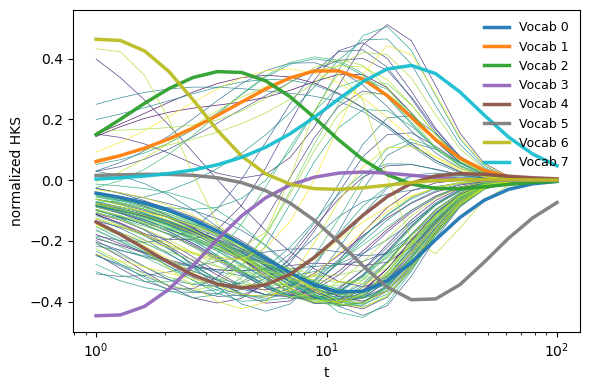

In [97]:
import matplotlib.pyplot as plt

def farthest_point_sampling(vertices, n_samples):
    N = vertices.shape[0]
    selected = np.zeros(n_samples, dtype=int)

    # pick initial point randomly
    selected[0] = np.random.randint(N)

    # distances to selected set
    dist = np.linalg.norm(vertices - vertices[selected[0]], axis=1)

    for i in range(1, n_samples):
        selected[i] = np.argmax(dist)
        new_dist = np.linalg.norm(vertices - vertices[selected[i]], axis=1)
        dist = np.minimum(dist, new_dist)

    return selected   


idx = farthest_point_sampling(mesh.v, 100) # sample 100 indices

cmap = plt.get_cmap('viridis')
colors = cmap(np.linspace(0, 1, len(idx)))

plt.figure(figsize=(6, 4))

# --- thin sampled mesh curves ---
for row_idx, color in zip(idx, colors):
    plt.plot(
        ts_vocab,
        normalised_hks[row_idx],
        color=color,
        linewidth=0.5,
        alpha=0.9
    )

# --- vocab curves (thicker + colored) ---
vocab_curves = np.asarray(vocab["vocab"], float)  # (M,T)
M = vocab_curves.shape[0]

vocab_colors = plt.get_cmap("tab10")(np.linspace(0, 1, M))

for m, vc in enumerate(vocab_colors):
    plt.plot(
        ts_vocab,
        vocab_curves[m],
        color=vc,
        linewidth=2.5,
        alpha=0.95,
        label=f"Vocab {m}"
    )

plt.xscale("log")
plt.xlabel("t")
plt.ylabel("normalized HKS")
plt.legend(frameon=False, fontsize=9)
plt.tight_layout()
plt.show()

Next, we plot the **normalized Heat Kernel Signature (HKS)** on the mesh. The normalized HKS highlights local geometric deviations from the average surface shape, allowing protrusions and other structural features—such as crypts—to become more visible across different time scales.

In [98]:
import ipywidgets as widgets
from IPython.display import display, clear_output
from organograph.plotting.meshes import plot_organoid_mesh

V, T = normalised_hks.shape
ts = np.asarray(ts_mesh, float)

slider = widgets.SelectionSlider(
    options=[(f"{t:.3g}", i) for i, t in enumerate(ts)],
    value=0,
    description="t",
    continuous_update=False,
    layout=widgets.Layout(width="600px"),
)

out = widgets.Output()

def draw(j):
    H = normalised_hks[:, j]
    fig = plot_organoid_mesh(
        mesh,
        vertex_values=H,
        backend="plotly",
        colorscale="RdBu_r",
        center_at_zero=True,
    )
    fig.update_layout(uirevision="keep")
    return fig

# initial draw
with out:
    clear_output(wait=True)
    display(draw(slider.value))

def update(change):
    with out:
        clear_output(wait=True)
        display(draw(change["new"]))

slider.observe(update, names="value")

display(slider, out)

SelectionSlider(continuous_update=False, description='t', layout=Layout(width='600px'), options=(('0.913', 0),…

Output()

Next, we visualize the **encoding values of each vocabulary feature on the mesh surface**. For every vertex, the normalized HKS is compared to the features in the vocabulary, producing a similarity score (encoding) for each feature. **Higher values indicate that the local geometry at that vertex more closely resembles the corresponding feature**, while lower values indicate weaker similarity.


In [99]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

Vxyz = np.asarray(mesh.v, float)
F = np.asarray(mesh.f, np.int64)

x, y, z = Vxyz[:, 0], Vxyz[:, 1], Vxyz[:, 2]
i, j, k = F[:, 0], F[:, 1], F[:, 2]

rows, cols = 2, 4
assert M == rows * cols, f"Expected 8 vocab entries, got M={M}"

fig = make_subplots(
    rows=rows, cols=cols,
    specs=[[{"type": "scene"} for _ in range(cols)] for _ in range(rows)],
    subplot_titles=[f"Vocab {m}" for m in range(M)],
    horizontal_spacing=0.01, vertical_spacing=0.05
)

# Use consistent color scaling across panels
cmin, cmax = 0.0, 1.0

# Fixed view similar to your plot_organoid_mesh defaults
azim = -135.0
elev = 25.0
az = np.deg2rad(azim)
el = np.deg2rad(elev)
r = 2.0
eye = dict(
    x=float(r * np.cos(el) * np.cos(az)),
    y=float(r * np.cos(el) * np.sin(az)),
    z=float(r * np.sin(el)),
)

for m in range(M):
    rr = (m // cols) + 1
    cc = (m % cols) + 1

    show_scale = (m == M - 1)  # show only once to reduce clutter

    fig.add_trace(
        go.Mesh3d(
            x=x, y=y, z=z,
            i=i, j=j, k=k,
            intensity=encoding[:, m],
            colorscale="Viridis",
            cmin=cmin, cmax=cmax,
            opacity=1.0,
            showscale=show_scale,
            colorbar=dict(title="enc") if show_scale else None,
        ),
        row=rr, col=cc
    )

    scene_name = f"scene{m+1}" if m > 0 else "scene"
    fig.layout[scene_name].update(
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        zaxis=dict(visible=False),
        bgcolor="rgba(0,0,0,0)",
        aspectmode="data",
        camera=dict(eye=eye),
    )

fig.update_layout(
    width=1400,
    height=700,
    margin=dict(l=10, r=10, t=40, b=10),
)
fig.show()

## 5) Crypt detection via encoding


### 5.1) Defining crypt filters

The segmentation pipeline supports **user-defined filters** that operate on candidate crypt patches.  
Filters are applied at different stages of the pipeline to remove false positives or enforce geometric constraints.

Each filter follows a standard interface:
`filter(patches, *, mesh, seg_vars, return_info=False)`
where:

- **patches** – list of candidate crypt patches (`list[set[int]]`)
- **mesh** – the organoid mesh
- **seg_vars** – dictionary containing additional quantities that filters may need (e.g. HKS, time axis, etc.)
- **return_info** – optional flag that allows the filter to return diagnostic information

A filter does **not modify the patches directly**.  
Instead, it returns a **boolean mask** indicating which patches should be kept.

Multiple filters can be combined by placing them in a list.  
They are applied sequentially by `apply_filters()`.

Typical filters include:

- **HKS-based filters** to remove small bumps that resemble crypts after HKS normalization
- **size filters** enforcing minimum patch area or vertex count

Users can easily add their own filters to this list as long as they follow the same function signature.

In [100]:
from organograph.crypts.filters import (
    filter_crypts_by_hks_percent,
    filter_crypts_by_size,
    apply_filters,
)

# ------------------------------------------------------------------
# Define filters used in the segmentation pipeline
# ------------------------------------------------------------------

filters = [

    # --- Raw HKS filter ---
    # Removes false positives caused by small bumps on the organoid surface.
    # A patch is kept only if its mean raw HKS exceeds the background by
    # a given percentage within a specified time range.
    lambda patches, **kw: filter_crypts_by_hks_percent(
        patches,
        min_percent_greater=3.0,
        t_max=10,   # only consider HKS values for times <= 10
        **kw
    ),

    # --- Size filter ---
    # Ensures detected crypts are large enough to be meaningful.
    lambda patches, **kw: filter_crypts_by_size(
        patches,
        min_patch_verts=25,
        min_patch_area=None,
        **kw
    ),
]

### 5.2) Detecting crypt candidates
In this step, we detect candidate crypt regions on the organoid surface using the vocabulary-based encoding of the normalized Heat Kernel Signature (HKS).

First, `detect_crypts_by_encoding()` performs an initial segmentation of the mesh. Each vertex receives a **crypt score** based on how strongly its encoded HKS matches vocabulary features associated with crypt-like geometries. Vertices whose scores exceed the chosen threshold are grouped into connected components, producing candidate crypt patches.

Next, we **apply the list of filters** defined in the cell above.

Finally, `subdivide_crypts_by_encoding()` refines the filtered patches. Large candidate regions are locally re-encoded and subdivided if they contain multiple crypt-like structures. This helps separate neighboring crypts that may have been merged during the initial detection.

In [101]:
from organograph.crypts.vocab import detect_crypts_by_encoding, subdivide_crypts_by_encoding


# --- Initial crypt detection ---
# Identify candidate crypt regions based on the vocabulary encoding of the
# normalized HKS. Vertices whose crypt score exceeds the threshold are grouped
# into connected components to form candidate patches.

crypts = detect_crypts_by_encoding(
    vocab,
    mesh,
    threshold=0.5,
)


# --- Variables required by filters ---
# Some filters use quantities computed earlier in the notebook. We pass them
# here so that the filters do not need to recompute them.

seg_vars = {
    "hks": hks,
    "ts_mesh": ts_mesh,
}


# --- Apply filters to candidate crypt patches ---
# Each filter returns a boolean mask indicating which patches should be kept.
# `apply_filters()` combines these masks and returns the filtered patch list.

crypts_filtered = apply_filters(
    crypts,
    filters=filters,
    mesh=mesh,
    seg_vars=seg_vars,
)[0]


# --- Refinement / subdivision step ---
# Larger candidate regions are re-encoded locally and subdivided if they
# contain multiple crypt-like structures. This helps separate neighboring
# crypts that may have been merged during the initial detection.

sub_crypts = subdivide_crypts_by_encoding(
    vocab,
    mesh,
    patches=crypts_filtered,
    threshold=0.0,
    refine_only_if_area_at_least=5,
    min_refined_frac_of_parent=0.05,
)

In [102]:
from plotly.subplots import make_subplots
from organograph.plotting.meshes import plot_mesh_by_regions

fig1 = plot_mesh_by_regions(
    mesh,
    crypts,                       # list[set[int]]
    backend="plotly",
    region_kind="auto",           # or "vertex" / "face"
    region_names=[f"crypt {i+1}" for i in range(len(crypts))],
    baseline_color="lightgray",
)
fig2 = plot_mesh_by_regions(
    mesh,
    crypts_filtered,                       # list[set[int]]
    backend="plotly",
    region_kind="auto",           # or "vertex" / "face"
    region_names=[f"crypt {i+1}" for i in range(len(crypts_filtered))],
    baseline_color="lightgray",
)
fig3 = plot_mesh_by_regions(
    mesh,
    sub_crypts,                       # list[set[int]]
    backend="plotly",
    region_kind="auto",           # or "vertex" / "face"
    region_names=[f"crypt {i+1}" for i in range(len(sub_crypts))],
    baseline_color="lightgray",
)

combo = make_subplots(
    rows=1, cols=3,
    specs=[[{"type": "scene"}, {"type": "scene"}, {"type": "scene"}]],
    subplot_titles=("detected", "filtered", "refined"),
)

for tr in fig1.data:
    combo.add_trace(tr, row=1, col=1)
for tr in fig2.data:
    combo.add_trace(tr, row=1, col=2)
for tr in fig3.data:
    combo.add_trace(tr, row=1, col=3)

# Copy scene layouts (camera/aspect) if you want them similar
combo.update_layout(
    scene=fig1.layout.scene if "scene" in fig1.layout else None,
    scene2=fig2.layout.scene if "scene" in fig2.layout else None,
    scene3=fig3.layout.scene if "scene" in fig3.layout else None,
    margin=dict(l=0, r=0, t=40, b=0),
)

combo

## 6) Computing crypt axes, normalizing to the neckline, and extending crypt regions

In this step we compute a **distance-based axis** for each refined crypt patch and use it to standardize crypt geometry across the organoid. For each crypt, we first compute a geodesic distance field measured from the **crypt bottom** along the mesh surface. This produces a per-crypt “axis coordinate” for every vertex.

Next, we **normalize** each crypt axis by estimating a **neckline location**. We do this by binning the distance field and computing the crypt **circumference as a function of distance**, then searching for a constriction (a local minimum) within a chosen interval. This allows us to rescale distance so that different crypts can be compared in a common coordinate system.

Finally, we use the normalized distance coordinate to **extend crypt patches** outward along the axis (e.g., up to the neckline or a fixed normalized distance), producing the final set of crypt regions.

In [103]:
from organograph.mesh.geodesics import compute_geodesics_dijkstra
from organograph.crypts.axis import compute_crypt_axis, normalize_crypt_axis_to_neckline, assign_features_by_distance

# --- 1) Compute crypt axis (geodesic distance from each crypt bottom) ---
# For each crypt patch, compute a geodesic distance field on the mesh surface.
# Outputs:
#   dnorm_all        : (N_crypts, V) distance fields normalized by crypt length
#   L_crypt_all      : (N_crypts,) crypt lengths (physical units)
#   bottom_vertex_ids: (N_crypts,) vertex indices of detected crypt bottoms
dnorm_all, L_crypt_all, bottom_vertex_ids = compute_crypt_axis(
    mesh,
    sub_crypts,
    compute_geodesics_dijkstra,
    geodesic_kwargs=None,
)

print("Crypt lengths before adjusting length to neckline:")
for i, L in enumerate(np.asarray(L_crypt_all, float)):
    print(f"  crypt {i+1:2d}: {L:.4g}")

# --- 2) Build bins along the normalized axis for circumference estimation ---
# We evaluate circumference curves C(s) on a fixed grid in normalized distance s.
s_max = 2.0
n_bins = 200
bin_edges   = np.linspace(0.0, s_max, n_bins + 1)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# --- 3) Normalize each crypt axis to the neckline ---
# For each crypt, compute circumference vs. distance and pick a neckline
# (a constriction) within the given search interval.
# Outputs:
#   circumf_crypts : circumference curves per crypt (evaluated at bin_centers)
#   dnorm_crypts   : (N_crypts, V) distances rescaled so that s~1 corresponds to the neckline
#   L_crypts       : updated crypt length scales after normalization
circumf_crypts, dnorm_crypts, L_crypts = normalize_crypt_axis_to_neckline(
    mesh,
    dnorm_all,
    bin_centers,
    search_interval=(0.75, bin_centers[-1]),
    L_crypt=L_crypt_all
)

print("Crypt lengths after adjusting length to neckline:")
for i, L in enumerate(np.asarray(L_crypts, float)):
    print(f"  crypt {i+1:2d}: {L:.4g}")

# --- 4) Extend crypt regions using the normalized axis coordinate ---
# Small crypts whose center lies inside the extent of a larger crypt are removed
# before final assignment/growth.
crypts_extended, best_feature, best_dist, surviving_idx = assign_features_by_distance(
    dnorm_crypts
)

# --- 5) Report deleted crypts and keep only surviving entries in all per-crypt arrays ---
all_idx = np.arange(dnorm_crypts.shape[0], dtype=int)
deleted_idx = np.setdiff1d(all_idx, surviving_idx)

if deleted_idx.size == 0:
    print("No crypt patches were deleted due to merger.")
else:
    print("Deleted crypt patches due to merger:")
    for k in deleted_idx:
        print(f"  crypt {k+1}")

# Keep only surviving crypt entries
sub_crypts        = [sub_crypts[k] for k in surviving_idx]
circumf_crypts    = circumf_crypts[surviving_idx]
dnorm_crypts      = dnorm_crypts[surviving_idx]
dnorm_all         = dnorm_all[surviving_idx]
L_crypt_all       = np.asarray(L_crypt_all)[surviving_idx]
L_crypts          = np.asarray(L_crypts)[surviving_idx]
bottom_vertex_ids = np.asarray(bottom_vertex_ids)[surviving_idx]

Crypt lengths before adjusting length to neckline:
  crypt  1: 2.478
  crypt  2: 1.169
  crypt  3: 0.4545
Crypt lengths after adjusting length to neckline:
  crypt  1: 2.032
  crypt  2: 1.87
  crypt  3: 0.5272
No crypt patches were deleted due to merger.


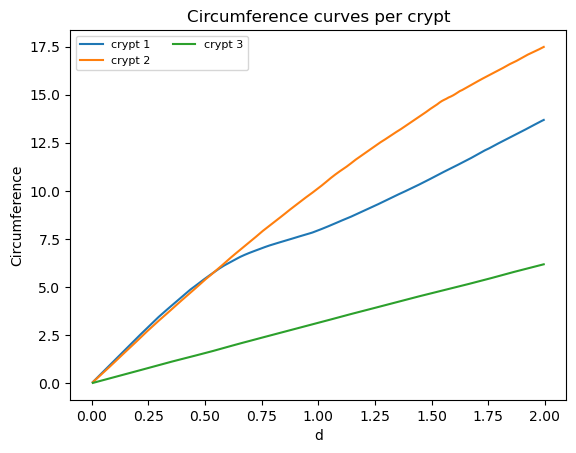

In [104]:
N = circumf_crypts.shape[0]

plt.figure()
for i in range(N):
    plt.plot(bin_centers, circumf_crypts[i], label=f"crypt {i+1}")
plt.xlabel("d")
plt.ylabel("Circumference")
plt.title("Circumference curves per crypt")
plt.legend(loc="best", ncol=2, fontsize=8)
plt.show()

In [105]:
from organograph.plotting.meshes import plot_mesh_by_regions, add_mesh_overlay

fig = plot_mesh_by_regions(
    mesh,
    crypts_extended,                       # list[set[int]]
    backend="plotly",
    region_kind="auto",           # or "vertex" / "face"
    region_names=[f"crypt {i+1}" for i in range(len(crypts_extended))],
    baseline_color="lightgray",
)

add_mesh_overlay(
    fig,
    mesh,
    bottom_vertex_ids,
    backend="plotly",           # "plotly" | "mpl3d" | "orthoprojs"
    mode="points",              # "points" | "area"
    size=10.0,                   
    name="crypt bottoms",
)

fig

## 7) Mapping crypt regions to organoid cells

In this section, we transfer the crypt segmentation from the surface mesh to the **cell-level representation of the organoid**. Each cell is associated with a projected vertex on the mesh, allowing the detected crypt regions to be mapped onto the corresponding cells.

We then visualize which cells belong to each crypt region. This provides a cell-level view of the segmentation, making it easier to analyze how crypt structures relate to the cellular organization of the organoid and to study properties of cells located within or outside crypt regions.


In [106]:
import pandas as pd

from organograph.io_utils.path_parsing import parse_mesh_path
from organograph.io_utils.cells_table import prepare_cells_table, make_nuclei_extractor
from organograph.graph.build import build_organoid_graph, assign_mesh_patches_to_graph

# --- Load cells table and build nuclei extractor ---
if not os.path.exists(CELLS_CSV):
    raise FileNotFoundError(f"CELLS_CSV not found: {CELLS_CSV}")

cells_df = pd.read_csv(CELLS_CSV)
cells_df = prepare_cells_table(cells_df, label_col="label_uid")

# COORD_COLS / MARKER_COLS / marker_postprocess come from your preprocessing script
CELL_CONFIG_PATH= os.path.join(NOTEBOOK_DIR, "..", "..", "NicoleData", DATASET, "cell_table_config.json")

cell_cfg    = load_cell_table_config(CELL_CONFIG_PATH)
COORD_COLS  = tuple(cell_cfg["coord_cols"])
MARKER_COLS = list(cell_cfg["marker_cols"])
MARKER_ALIAS = list(cell_cfg["marker_names"])
LGR5_MARKER = cell_cfg["lgr5_marker"]
COEXP_MARKERS = tuple(cell_cfg["coexp_markers"])

rec = parse_mesh_path(MESH_PATH)
label_uid = rec.get("label_uid", None)
mesh.label_uid = label_uid

extractor = make_nuclei_extractor(
    cells_df,
    label_col="label_uid",
    xyz_cols=COORD_COLS,
    marker_cols=MARKER_COLS,
)


# --- Build graph ---
G, aux = build_organoid_graph(mesh=mesh, extract_fn=extractor)

print("Graph built.")
print("  N_cells =", G.number_of_nodes())
print("  N_edges =", G.number_of_edges())
print("  marker_names =", G.graph.get("marker_names", None))


# --- Assign crypts to graph ---
graph_patches, info = assign_mesh_patches_to_graph(G, crypts_extended, return_node_ids=False)

Duplicate projections: none.
Graph built.
  N_cells = 205
  N_edges = 609
  marker_names = ['LGR.bin', 'CHROMA.bin', 'CYCD.bin', 'MUC.bin', 'ALDOB.bin', 'GLUC.bin', 'CYCA.bin', 'AGR.bin', 'SERO.bin', 'LYZ.bin']


/home/fmoller/Projects/LearningOrganoids/OrganoGraph/src/organograph/io_utils/cells_table.py:190: RuntimeWarning:

prepare_cells_table: 'label_uid' index contains duplicates. This is usually expected (multiple cells per organoid). df.loc[label_uid] will return multiple rows.



In [107]:
from organograph.plotting.graphs import plot_graph_by_markers
from organograph.plotting.graphs import add_region_overlays


BACKEND = "plotly"
VIEW = dict(azim=-135, elev=25, projection="orthographic")

NODE_SIZE = 5
EDGE_WIDTH = 1.0

# Crypt overlay style
CRYPT_OVERLAY_COLOR = None           # set to e.g. "#FFD700" to force single-color
CRYPT_OVERLAY_COLORSCALE = "Turbo"
CRYPT_OVERLAY_ALPHA = 0.6
CRYPT_OVERLAY_SIZE_MULT = 1.7

# Marker definitions (use marker *names* here; graphs.py resolves them)
MARKER_NAMES = list(cell_cfg["marker_names"])

i_LGR5 = MARKER_NAMES.index("LGR5")
i_AldoB = MARKER_NAMES.index("AldoB")
i_Sero = MARKER_NAMES.index("Serotonin")
i_Lyso = MARKER_NAMES.index("Lysozyme")

# Marker definitions for coloring (edit to match your marker_names)
DEFAULT_MARKER_MAP = [
    {"marker": i_LGR5, "color": "#1f77b4", "name": "stem cell (LGR5+)"},
    {"marker": i_AldoB, "color": "#2ca02c", "name": "absorptive (AldoB+)"},
    {"marker": i_Sero, "color": "#d62728", "name": "enterochromaffin (Serotonin+)"},
    {"marker": i_Lyso, "color": "#9467bd", "name": "paneth (Lysozyme+)"},
]
# --- Base plot: markers ---
fig = plot_graph_by_markers(
    G,
    DEFAULT_MARKER_MAP,
    backend=BACKEND,
    view=VIEW,
    node_size=NODE_SIZE,
    edge_width=EDGE_WIDTH,
)

# --- Overlay: one region per crypt (so each crypt can get its own color) ---
regions = [set(map(int, c)) for c in (graph_patches or [])]  # crypts is typically list[set[int]] already

# Decide whether to use single-color or colormap
overlay_colors = [CRYPT_OVERLAY_COLOR] if CRYPT_OVERLAY_COLOR else None
overlay_colorscale = None if CRYPT_OVERLAY_COLOR else CRYPT_OVERLAY_COLORSCALE

if regions:
    add_region_overlays(
        fig, G, graph_patches,
        backend="plotly",
        colors=overlay_colors,
        colorscale=overlay_colorscale,
        size=NODE_SIZE * CRYPT_OVERLAY_SIZE_MULT,
        name_prefix="crypt",
        alpha=CRYPT_OVERLAY_ALPHA,
    )

fig

## 8) Interactive exploration of segmentation parameters

In this cell, we provide an interactive widget that allows the user to **adjust key parameters of the crypt segmentation pipeline** and immediately visualize the resulting segmentation on the mesh. By modifying parameters such as detection thresholds, refinement settings, and filtering criteria, users can explore how these choices influence the identification and separation of crypt regions.

This interactive tool makes it easier to **experiment with parameter settings and understand the behavior of the segmentation algorithm** without repeatedly editing and re-running multiple code cells.


In [108]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import plotly.graph_objects as go

from organograph.crypts.segment import segment_crypts_organoid

# Controls
style = {"description_width": "220px"}
layout = widgets.Layout(width="500px")

w_threshold = widgets.FloatSlider(
    value=0.5, min=0.0, max=1.0, step=0.01,
    description="detection threshold",
    style=style,
    layout=layout,
)

w_refine = widgets.Checkbox(
    value=True,
    description="refine crypts",
    style=style,
    layout=layout,
)

w_remove_nested = widgets.Checkbox(
    value=True,
    description="remove nested crypts",
    style=style,
    layout=layout,
)

w_refine_threshold = widgets.FloatSlider(
    value=0.0, min=0.0, max=1.0, step=0.01,
    description="refine threshold",
    style=style,
    layout=layout,
)

w_extend_max = widgets.FloatSlider(
    value=2.0, min=1.0, max=5.0, step=0.1,
    description="max dist for neck search",
    style=style,
    layout=layout,
)

w_min_hks_percent = widgets.FloatSlider(
    value=1.0, min=0.0, max=5.0, step=0.5,
    description="min HKS percentage above avg",
    style=style,
    layout=layout,
)

w_min_patch_verts = widgets.FloatSlider(
    value=25, min=0, max=50, step=5,
    description="min vertices in crypt",
    style=style,
    layout=layout,
)

w_min_patch_area = widgets.FloatSlider(
    value=0.0, min=0.0, max=20.0, step=0.5,
    description="min area of crypt",
    style=style,
    layout=layout,
)

btn = widgets.Button(description="Run segmentation", button_style="success")
out = widgets.Output()

palette = [
    "#e41a1c", "#377eb8", "#4daf4a", "#984ea3",
    "#ff7f00", "#a65628", "#f781bf", "#999999",
]

def run(_=None):
    with out:
        clear_output(wait=True)

        filters = [
            lambda patches, **kw: filter_crypts_by_hks_percent(
                patches,
                min_percent_greater=w_min_hks_percent.value,
                t_max=10,
                **kw
            ),
            lambda patches, **kw: filter_crypts_by_size(
                patches,
                min_patch_verts=w_min_patch_verts.value,
                min_patch_area=w_min_patch_area.value,
                **kw
            ),
        ]

        crypts, seg_vars = segment_crypts_organoid(
            mesh,
            vocab,
            geodesic_fn=compute_geodesics_dijkstra,
            threshold=w_threshold.value,
            refine_crypts=w_refine.value,
            refine_threshold=w_refine_threshold.value,
            extend_max=w_extend_max.value,
            remove_nested_features=w_remove_nested.value,
            filter_fn_list=filters,
            return_vars=True,
        )

        # --- Mesh plot ---
        fig = plot_mesh_by_regions(
            mesh,
            crypts,
            backend="plotly",
            region_kind="auto",
            region_names=[f"crypt {i+1}" for i in range(len(crypts))],
            baseline_color="lightgray",
        )

        add_mesh_overlay(
            fig,
            mesh,
            seg_vars["bottom_vertex_ids"],
            backend="plotly",
            mode="points",
            size=10.0,
            name="crypt bottoms",
        )

        display(fig)

        # --- Circumference curves plot ---
        d = np.asarray(seg_vars["d_discretized"], float)
        C = np.asarray(seg_vars["circumference_crypts"], float)

        if C.ndim != 2:
            raise ValueError(f"seg_vars['circumference_crypts'] must be 2D, got shape {C.shape}")

        # Make sure C is (N_crypts, B)
        if C.shape[1] == d.size:
            C_plot = C
        elif C.shape[0] == d.size:
            C_plot = C.T
        else:
            raise ValueError(
                f"d_discretized has length {d.size}, but circumference_crypts has shape {C.shape}"
            )

        fig_c = go.Figure()
        for i in range(C_plot.shape[0]):
            fig_c.add_trace(go.Scatter(
                x=d,
                y=C_plot[i],
                mode="lines",
                name=f"crypt {i+1}",
                line=dict(color=palette[i % len(palette)], width=3),
            ))

        fig_c.update_layout(
            title="Crypt circumference curves",
            xaxis_title="Normalized axis distance",
            yaxis_title="Circumference",
            template="plotly_white",
            width=650,
            height=600,
            margin=dict(l=60, r=30, t=60, b=60),
        )

        display(fig_c)

        # --- Print per-crypt summary ---
        constr = seg_vars.get("crypt_constrictions", None)
        elong = seg_vars.get("crypt_elongations", None)

        if constr is not None:
            constr = np.asarray(constr, float)
        if elong is not None:
            elong = np.asarray(elong, float)

        print("Per-crypt summary:")
        for i in range(len(crypts)):
            parts = [f"crypt {i+1}"]
            if constr is not None and i < len(constr):
                parts.append(f"constriction={constr[i]:.4f}")
            if elong is not None and i < len(elong):
                parts.append(f"elongation={elong[i]:.4f}")
            print("  " + ", ".join(parts))

btn.on_click(run)

# Optional: disable refine_threshold slider when refine is off
def _toggle_refine(change):
    w_refine_threshold.disabled = not change["new"]

w_refine.observe(_toggle_refine, names="value")
_toggle_refine({"new": w_refine.value})

ui = widgets.VBox([
    w_threshold,
    w_refine,
    w_remove_nested,
    w_refine_threshold,
    w_extend_max,
    w_min_hks_percent,
    w_min_patch_verts,
    w_min_patch_area,
    btn
])

display(ui, out)

Output()